<a href="https://colab.research.google.com/github/FHNW-IVGI/workshop_geopython2019/blob/master/FasterRCNN_Tutorial_MeyerA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection Tutorial with Faster R-CNN Transfer Learning
## Geopython 2019, Adrian F. Meyer
Parts of this tutorial are based on the [Medium article](https://hackernoon.com/object-detection-in-google-colab-with-custom-dataset-5a7bb2b0e97e) by RomRoc, 2018.

**In this Tutorial we will learn, how to use the Tensorflow Object Detection library, to detect solar panels on tiles of an aerial orthomosaic.**

![alt text](https://wilddrone.ch/wp-content/uploads/2019/06/solardetector.jpg)

The code, libraries and cloud environments used in this tutorial are currently available for free and are generally released open source.
You will need a Google account to execute the Notebook in its entirety, because it is meant to be executed on the Google Colab platform.

*Go to [Google Colab](https://colab.research.google.com/) and upload the notebook there. Make sure that you use Python 3 and GPU hardware acceleration as Runtime Environment.*

The dataset provided is based on the publically available SwissImage orthomosaic by [SwissTopo](https://map.geo.admin.ch/?topic=swisstopo&lang=de&bgLayer=ch.swisstopo.swissimage). 
The images and annotations can be downloaded as Zip File (31 Mbyte) here:
[https://drive.google.com/file/d/1i9RlEJTeB-KRauwhuMp-Vl13-Z3Yrj_y/view?usp=sharing](https://drive.google.com/file/d/1i9RlEJTeB-KRauwhuMp-Vl13-Z3Yrj_y/view?usp=sharing)



![alt text](https://wilddrone.ch/wp-content/uploads/2019/06/Tiles.jpg)

# Download Tensorflow Repo and Python Modules
By executing the first code snippet you initialize your virtual linux-style machine. Use The little arrow ">" in the top left corner to view the file system of your hosted system.
You can use UNIX-style terminal commands by using the prefix % and elevated priviledge commands for installations with the prefix !.

In [0]:
%cd
  
!git clone https://github.com/tensorflow/models.git

!apt-get install protobuf-compiler python-tk

!pip install Cython contextlib2 pillow lxml matplotlib PyDrive

!pip install pycocotools

%cd ~/models/research
!protoc object_detection/protos/*.proto --python_out=.

import os
os.environ['PYTHONPATH'] += ':/models/research/:/models/research/slim/'


/root
Cloning into 'models'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 27871 (delta 10), reused 12 (delta 2), pack-reused 27845
Receiving objects: 100% (27871/27871), 509.19 MiB | 28.59 MiB/s, done.
Resolving deltas: 100% (17092/17092), done.
Checking out files: 100% (3003/3003), done.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
python-tk is already the newest version (2.7.15~rc1-1).
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.
     |████████████████████████████████| 993kB 6.7MB/s 
  Stored in directory: /root/.cache/pip/wheels/fa/d2/9a/d3b6b506c2da98289e5d417215ce34b696db856643bad779f4
Successfully built PyDriv

# Install Tensorflow on Virtual Machine

In [0]:
!python setup.py build
!python setup.py install > /dev/null

running build
running build_py
running egg_info
writing object_detection.egg-info/PKG-INFO
writing dependency_links to object_detection.egg-info/dependency_links.txt
writing requirements to object_detection.egg-info/requires.txt
writing top-level names to object_detection.egg-info/top_level.txt
writing manifest file 'object_detection.egg-info/SOURCES.txt'
zip_safe flag not set; analyzing archive contents...
object_detection.core.__pycache__.preprocessor.cpython-36: module MAY be using inspect.stack


In [0]:
%cd slim
!pip install -e .

%cd ..
!python object_detection/builders/model_builder_test.py

/root/models/research/slim
Obtaining file:///root/models/research/slim
  Running setup.py develop for slim
/root/models/research
W0620 08:33:02.147366 140487852562304 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W0620 08:33:02.328968 140487852562304 deprecation_wrapper.py:119] From /root/models/research/slim/nets/inception_resnet_v2.py:373: The name tf.GraphKeys is deprecated. Please use tf.compat.v1.GraphKeys instead.

W0620 08:33:02.363010 140487852562304 deprecation_wrapper.py:119] From /root/models/research/slim/nets/mobilenet/mobilenet.py:397: The name tf.nn.avg_pool is deprecated. Please use tf.nn.avg_pool2d instead.

Running tests under Python 3.

#Upload and Import Dataset

In [0]:
%cd /datalab
!wget http://2019.geopython.net/data/solar.zip

/datalab
--2019-06-20 08:43:07--  http://2019.geopython.net/data/solar.zip
Resolving 2019.geopython.net (2019.geopython.net)... 147.86.7.67
Connecting to 2019.geopython.net (2019.geopython.net)|147.86.7.67|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33438193 (32M) [application/zip]
Saving to: ‘solar.zip’

solar.zip           100%[===================>]  31.89M  77.4MB/s    in 0.4s    

2019-06-20 08:43:08 (77.4 MB/s) - ‘solar.zip’ saved [33438193/33438193]



In [0]:
%cd /datalab
!unzip -q -f solar.zip

/datalab


In [0]:
%cd ..
%cd /datalab

!echo "item { id: 1 name: 'solar'}" > label_map.pbtxt

image_files=os.listdir('images')
im_files=[x.split('.')[0] for x in image_files]
with open('annotations/trainval.txt', 'w') as text_file:
  for row in im_files:
    text_file.write(row + '\n')

/
/datalab


#Data and Model Preparation
## Generate Bounding Boxes on Images for RPN Network Training

In [0]:
%cd /datalab/annotations

!mkdir trimaps

from PIL import Image
image = Image.new('RGB', (901, 791))

for filename in os.listdir('xmls'):
  filename = os.path.splitext(filename)[0]
  image.save('trimaps/' + filename + '.png')

/datalab/annotations


##Generate Labelled Tensor Matrices (tf_records)

In [0]:
%cd /datalab

!python ~/models/research/object_detection/dataset_tools/create_pet_tf_record.py --label_map_path=label_map.pbtxt --data_dir=. --output_dir=. --num_shards=1

!mv pet_faces_train.record-00000-of-00001 tf_train.record

!mv pet_faces_val.record-00000-of-00001 tf_val.record

/datalab
W0620 08:51:46.726222 140487561709440 deprecation_wrapper.py:119] From /root/models/research/object_detection/dataset_tools/create_pet_tf_record.py:318: The name tf.app.run is deprecated. Please use tf.compat.v1.app.run instead.

W0620 08:51:46.726927 140487561709440 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/object_detection-0.1-py3.6.egg/object_detection/utils/label_map_util.py:132: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

I0620 08:51:46.729721 140487561709440 create_pet_tf_record.py:273] Reading from Pet dataset.
I0620 08:51:46.730934 140487561709440 create_pet_tf_record.py:288] 148 training and 64 validation examples.
W0620 08:51:46.731162 140487561709440 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/object_detection-0.1-py3.6.egg/object_detection/dataset_tools/tf_record_creation_util.py:43: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.

##Download the Model Checkpoint you want to use for Transfer Learning

In [0]:
%cd /datalab
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
%cd /datalab
!tar -xvzf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
%cd /datalab
!mv faster_rcnn_inception_v2_coco_2018_01_28 pretrained_model

/datalab
--2019-06-20 09:10:12--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.15.128, 2a00:1450:400c:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.15.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149119618 (142M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz.2’

faster_rcnn_incepti 100%[===================>] 142.21M   282MB/s    in 0.5s    

2019-06-20 09:10:13 (282 MB/s) - ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz.2’ saved [149119618/149119618]

/datalab
faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v

##Configure the Paths and Training Parameters

In [0]:
%cd /datalab

import re

#filename = '/datalab/pretrained_model/pipeline.config'
filename = '/root/models/research/object_detection/samples/configs/faster_rcnn_inception_v2_pets.config'
with open(filename) as f:
  s = f.read()
with open(filename, 'w') as f:
  s = re.sub('PATH_TO_BE_CONFIGURED/model.ckpt', '/datalab/pretrained_model/model.ckpt', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/pet_faces_train.record-\?\?\?\?\?-of-00010', '/datalab/tf_train.record', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/pet_faces_val.record-\?\?\?\?\?-of-00010', '/datalab/tf_val.record', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/pet_label_map.pbtxt', '/datalab/label_map.pbtxt', s)
  f.write(s)

/datalab


# Training on GPU
The execution of this snippet might take a while. Normally the training should take about 10 minutes (approx. 12 seconds for 100 steps). As a estimation, the loss value should fall below 0.05 over a few hundred steps and then the training can be abortet. Automatic termination after 3'000 Steps can be reconfigured.

In [0]:
%cd /datalab

%cp -R /datalab /content

!python ~/models/research/object_detection/model_main.py \
    --pipeline_config_path=/root/models/research/object_detection/samples/configs/faster_rcnn_inception_v2_pets.config \
    --model_dir=/datalab/trained \
    --alsologtostderr \
    --num_train_steps=3000 \
    --num_eval_steps=500

/datalab
W0620 09:15:22.960839 139950340290432 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W0620 09:15:22.993180 139950340290432 deprecation_wrapper.py:119] From /root/models/research/slim/nets/inception_resnet_v2.py:373: The name tf.GraphKeys is deprecated. Please use tf.compat.v1.GraphKeys instead.

W0620 09:15:23.006470 139950340290432 deprecation_wrapper.py:119] From /root/models/research/slim/nets/mobilenet/mobilenet.py:397: The name tf.nn.avg_pool is deprecated. Please use tf.nn.avg_pool2d instead.

W0620 09:15:23.019822 139950340290432 deprecation_wrapper.py:119] From /root/models/research/object_detection/model_main.py:109: The name tf.app.run 

# Export Inference Graph

In [0]:
%cd /datalab

lst = os.listdir('trained')
lf = filter(lambda k: 'model.ckpt-' in k, lst)
last_model = sorted(lf)[-1].replace('.meta', '')

!python ~/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path=/root/models/research/object_detection/samples/configs/faster_rcnn_inception_v2_pets.config \
    --output_directory=fine_tuned_model \
    --trained_checkpoint_prefix=trained/$last_model

/datalab
W0620 09:33:17.874576 140361502599040 deprecation_wrapper.py:119] From /root/models/research/slim/nets/inception_resnet_v2.py:373: The name tf.GraphKeys is deprecated. Please use tf.compat.v1.GraphKeys instead.

W0620 09:33:17.888224 140361502599040 deprecation_wrapper.py:119] From /root/models/research/slim/nets/mobilenet/mobilenet.py:397: The name tf.nn.avg_pool is deprecated. Please use tf.nn.avg_pool2d instead.

W0620 09:33:17.901341 140361502599040 deprecation_wrapper.py:119] From /root/models/research/object_detection/export_inference_graph.py:156: The name tf.app.run is deprecated. Please use tf.compat.v1.app.run instead.

W0620 09:33:17.902107 140361502599040 deprecation_wrapper.py:119] From /root/models/research/object_detection/export_inference_graph.py:139: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

W0620 09:33:17.908828 140361502599040 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/object_detection-0.1-py3

In [0]:
#Alternative to training download a fully trained model inference graph by uncommenting (#)

#%cd /datalab
#!wget http://2019.geopython.net/data/trained.tar.gz
#%cd /datalab
#!tar -xzf trained.tar.gz

/datalab
--2019-06-20 10:50:04--  http://2019.geopython.net/data/trained.tar.gz
Resolving 2019.geopython.net (2019.geopython.net)... 147.86.7.67
Connecting to 2019.geopython.net (2019.geopython.net)|147.86.7.67|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 312891678 (298M) [application/octet-stream]
Saving to: ‘trained.tar.gz.1’

trained.tar.gz.1    100%[===================>] 298.40M   106MB/s    in 2.8s    

2019-06-20 10:50:07 (106 MB/s) - ‘trained.tar.gz.1’ saved [312891678/312891678]

/datalab


# Run Inference

/root/models/research/object_detection


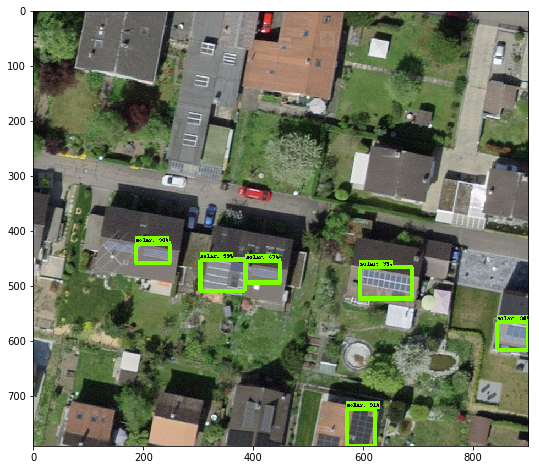

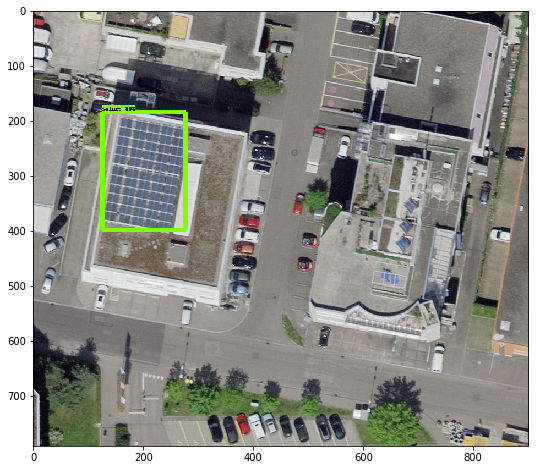

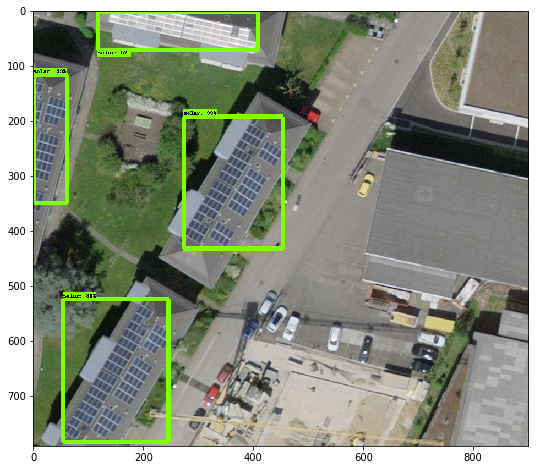

In [0]:
%cd /root/models/research/object_detection




import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops

#if tf.__version__ < '1.4.0':
#  raise ImportError('Please upgrade your tensorflow installation to v1.4.* or later!')
  

  
  
# This is needed to display the images.
%matplotlib inline




from utils import label_map_util

from utils import visualization_utils as vis_util




# What model to download.
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = '/datalab/fine_tuned_model' + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('/content/datalab', 'label_map.pbtxt')

NUM_CLASSES = 37




detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
    
    
    
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)




def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)




# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = '/datalab/testsamples/'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.JPG'.format(i)) for i in range(1, 4) ]

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)




def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict




for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)

## Run Inferencing on Additional Samples

/root/models/research/object_detection


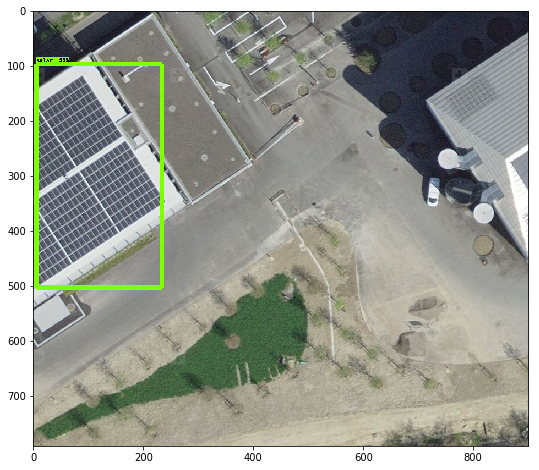

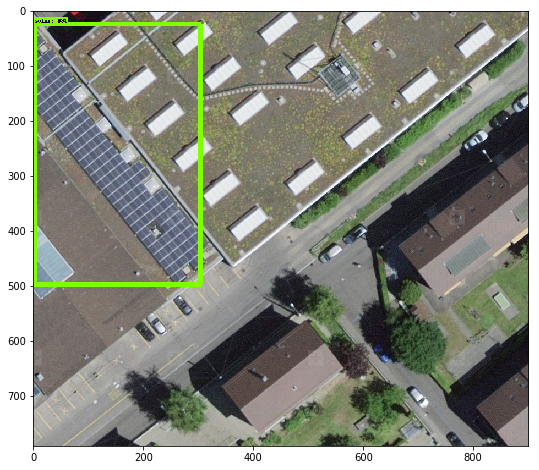

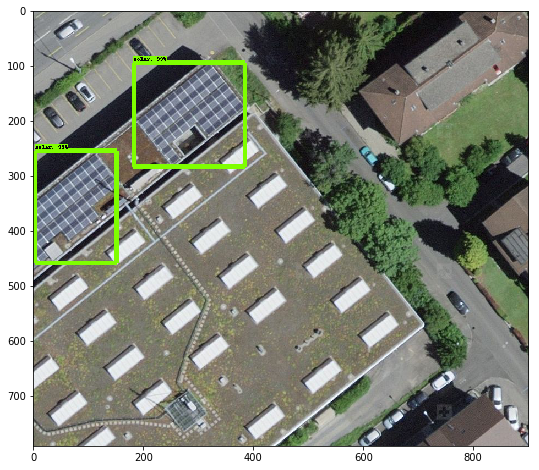

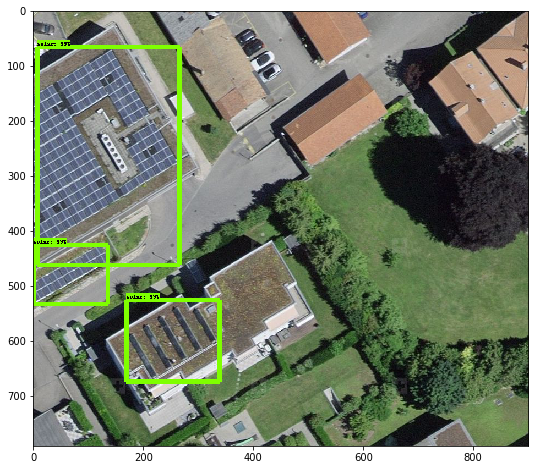

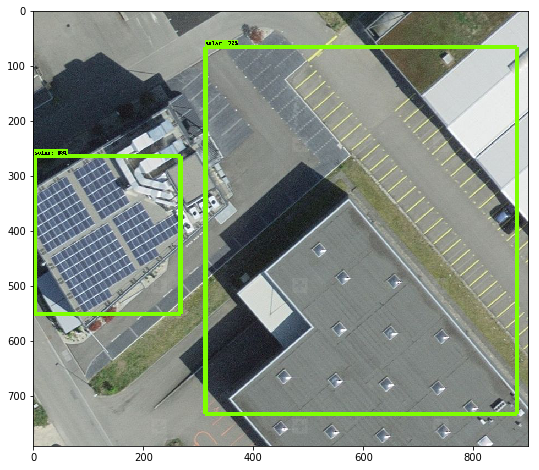

...

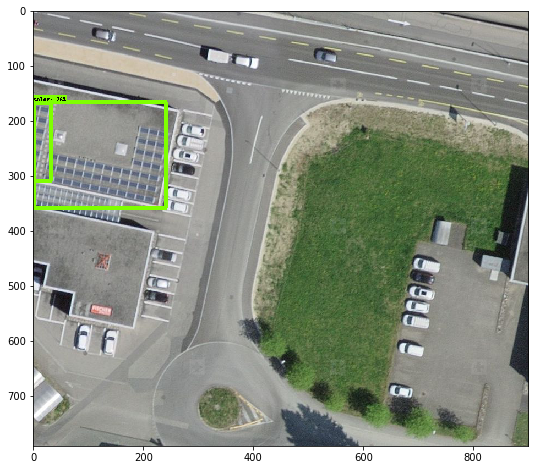

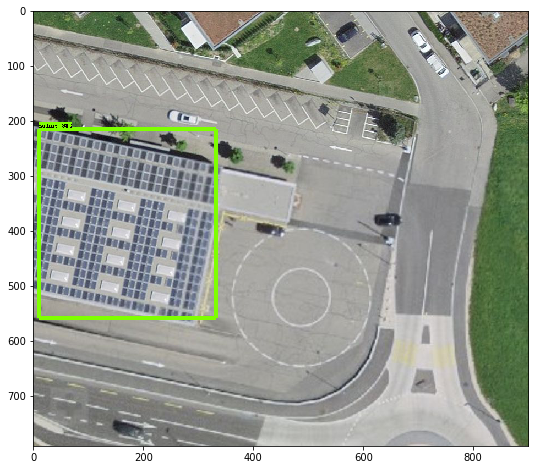

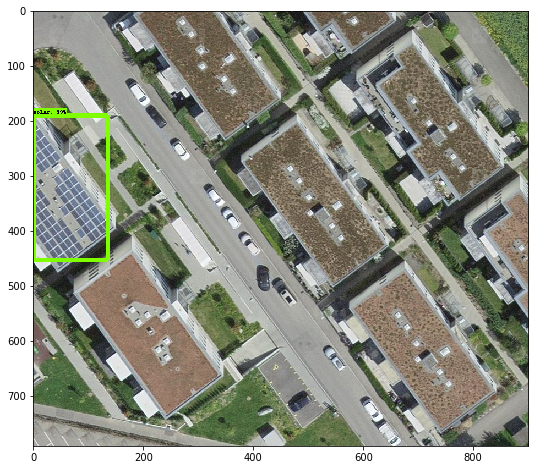

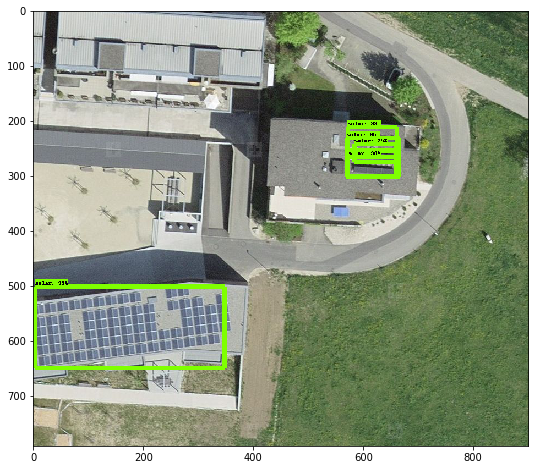

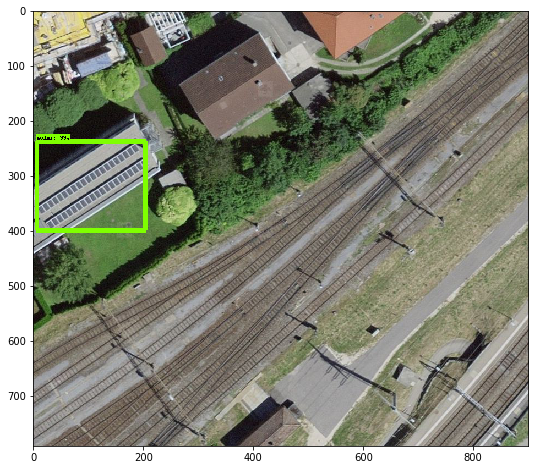

In [0]:
%cd /root/models/research/object_detection




import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops

#if tf.__version__ < '1.4.0':
#  raise ImportError('Please upgrade your tensorflow installation to v1.4.* or later!')
  

  
  
# This is needed to display the images.
%matplotlib inline




from utils import label_map_util

from utils import visualization_utils as vis_util




# What model to download.
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = '/datalab/fine_tuned_model' + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('/content/datalab', 'label_map.pbtxt')

NUM_CLASSES = 37




detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
    
    
    
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)




def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)




# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = '/datalab/images/'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'solar_{}.JPG'.format(i)) for i in range(150, 166) ]

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)




def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict




for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)